Processed lions-bay-loop-1-of-1-1200x851.jpg and saved to output/lions-bay-loop-1-of-1-1200x851.jpg


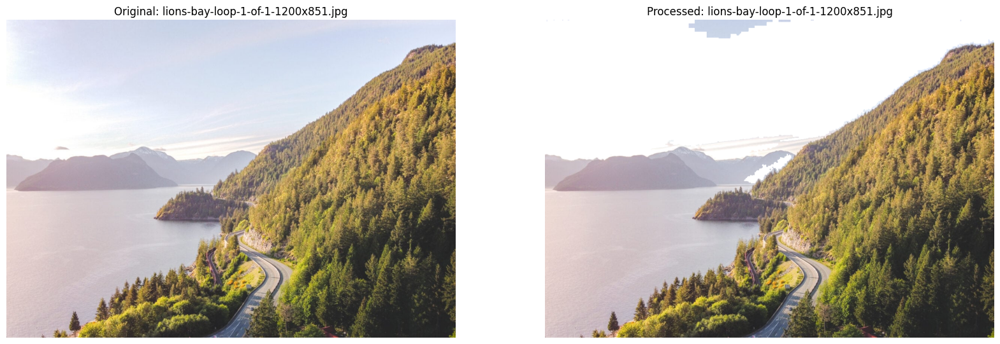

Processed A-Family-Sea-To-Sky-GeoTour-From-Vancouver-istock.comedb3_16-Small.jpg and saved to output/A-Family-Sea-To-Sky-GeoTour-From-Vancouver-istock.comedb3_16-Small.jpg


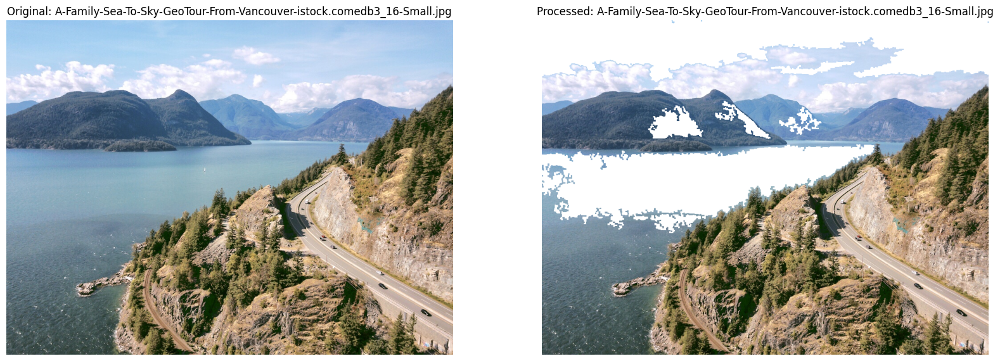

Processed EastVan.jpg and saved to output/EastVan.jpg


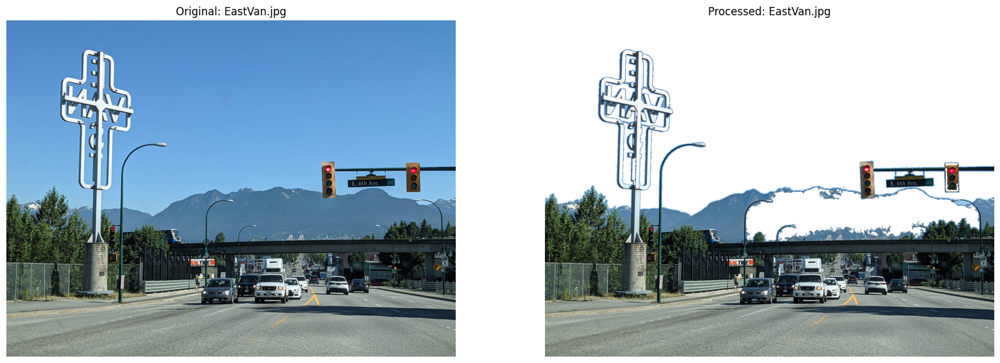

Processed pic-sky-residences-vancouver-9.jpg and saved to output/pic-sky-residences-vancouver-9.jpg


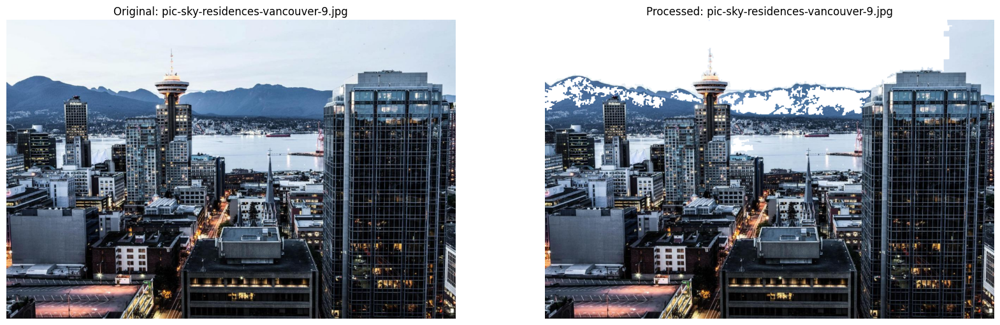

Processed Sea-to-Sky-Highway-BC-A-City-Girl-Outside.jpg and saved to output/Sea-to-Sky-Highway-BC-A-City-Girl-Outside.jpg


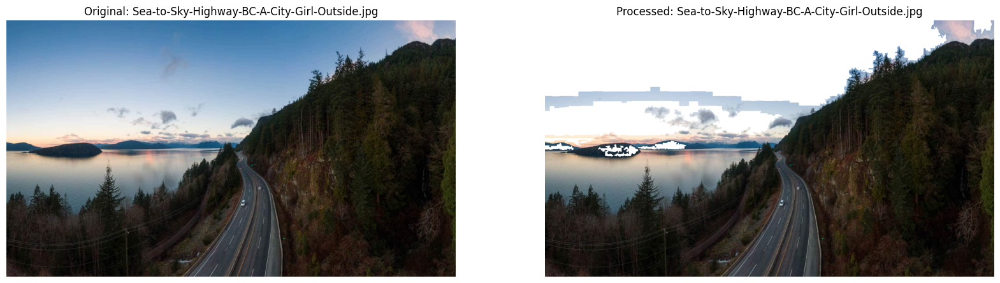

Processed smoke-blue-sky.jpg and saved to output/smoke-blue-sky.jpg


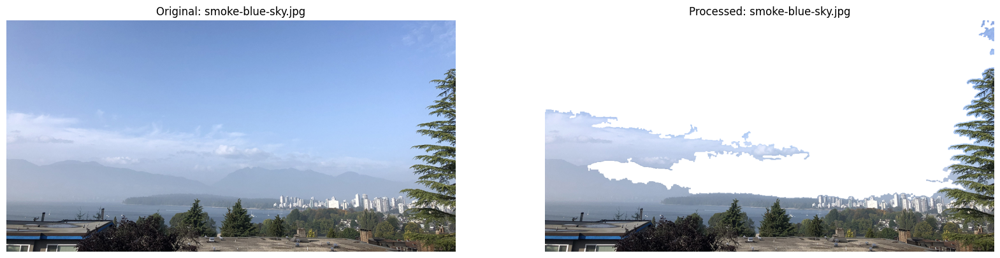

Processed 46744388.jpg and saved to output/46744388.jpg


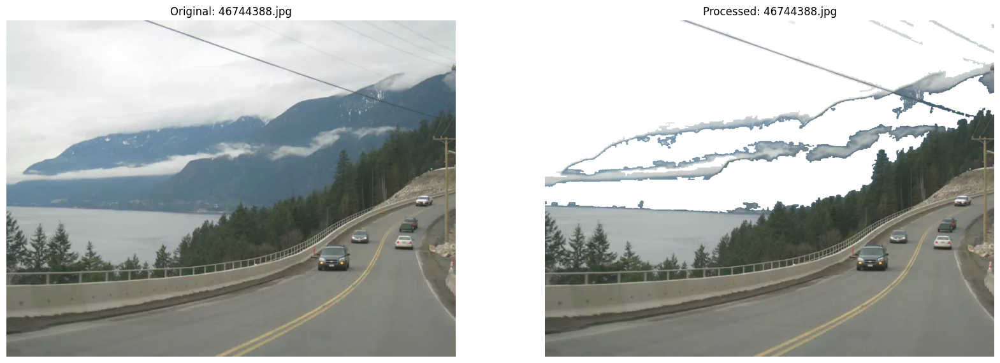

Processed Sea-to-Sky-Highway-1.jpg and saved to output/Sea-to-Sky-Highway-1.jpg


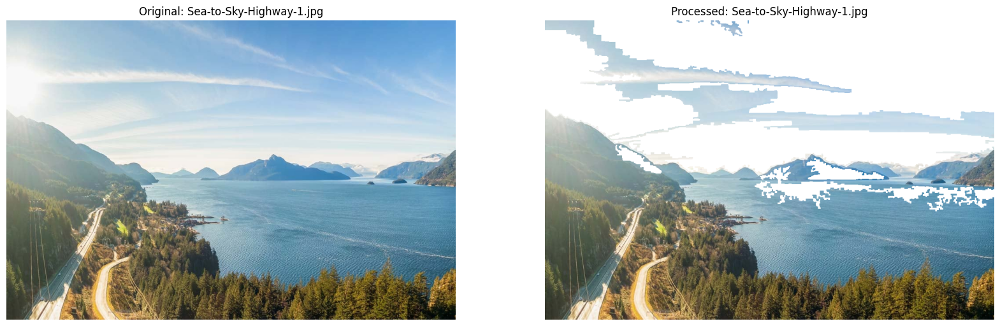

Processed IMG_4978_2048x@2x.jpg and saved to output/IMG_4978_2048x@2x.jpg


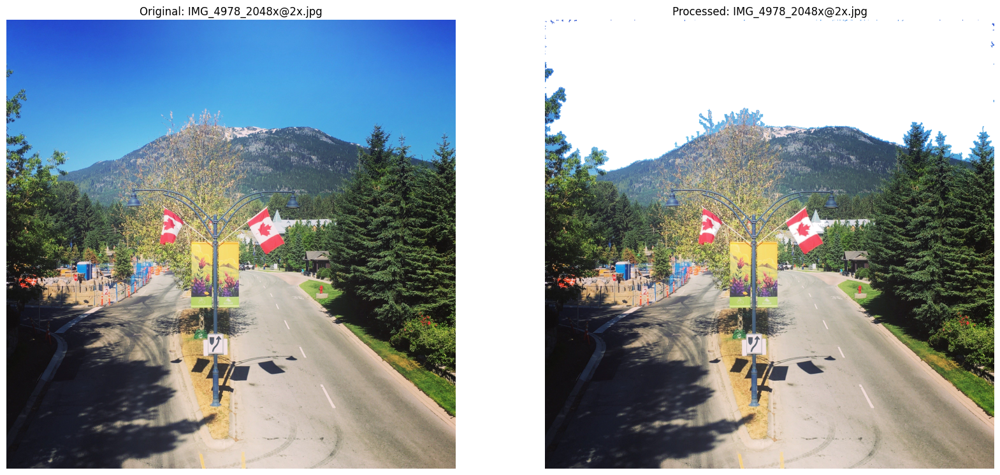

Processed Squamish-Sea-to-Sky-Gondola.jpg and saved to output/Squamish-Sea-to-Sky-Gondola.jpg


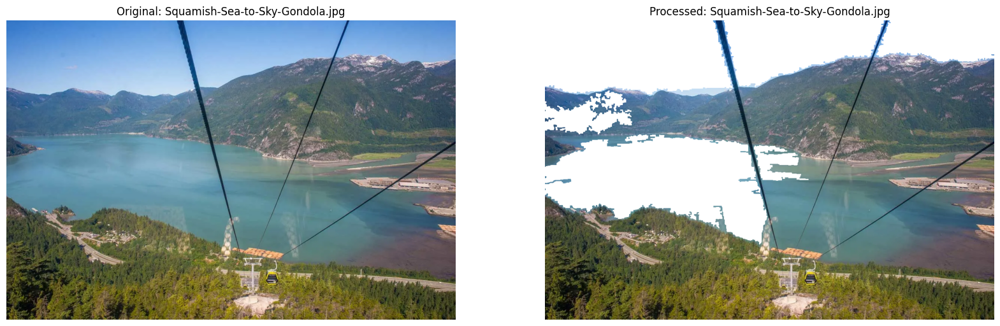

Processed vancouver-sky-line-canada.jpg and saved to output/vancouver-sky-line-canada.jpg


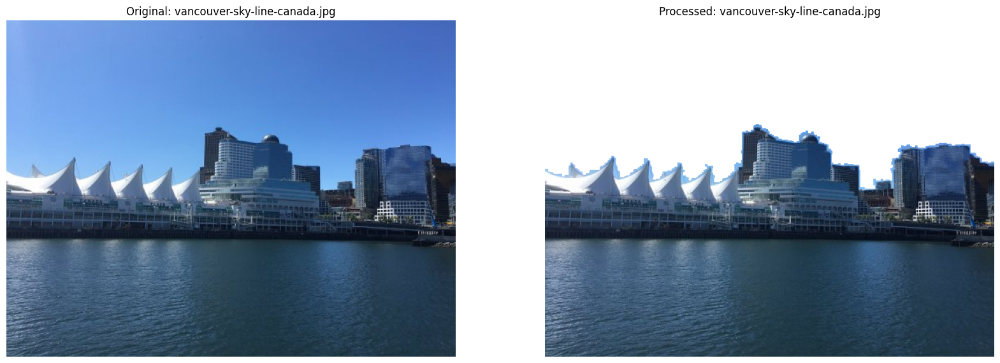

Processed ac.jpg and saved to output/ac.jpg


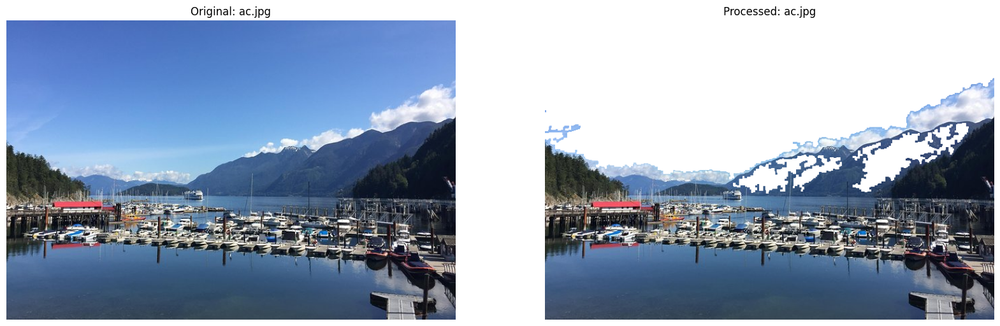

Processed TAL-vancouver-spring-WHENVANCOUVER0723-5240b1b3a34040cf95318d45d863d620.jpg and saved to output/TAL-vancouver-spring-WHENVANCOUVER0723-5240b1b3a34040cf95318d45d863d620.jpg


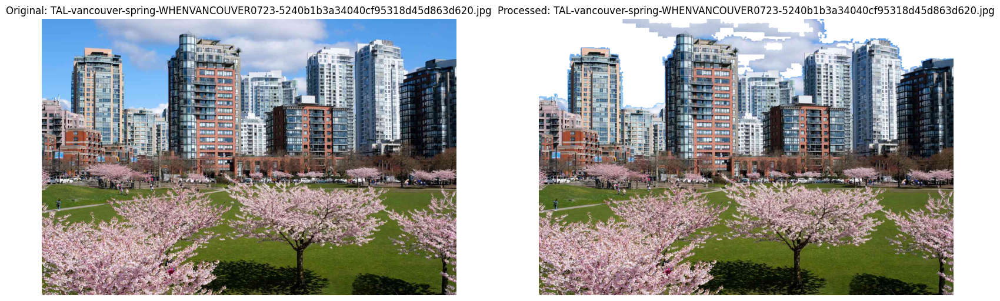

Processed vancouver-1620771_1280.jpg and saved to output/vancouver-1620771_1280.jpg


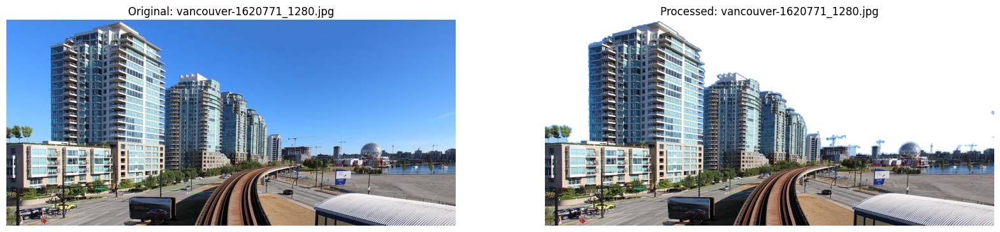

Processed maxresdefault.jpg and saved to output/maxresdefault.jpg


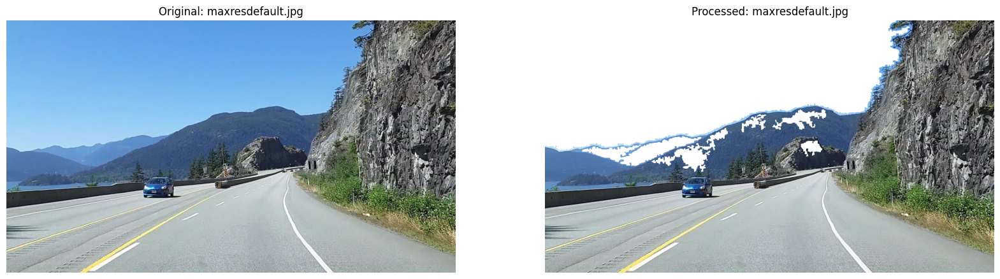

Processed vancouver_skyline.jpg and saved to output/vancouver_skyline.jpg


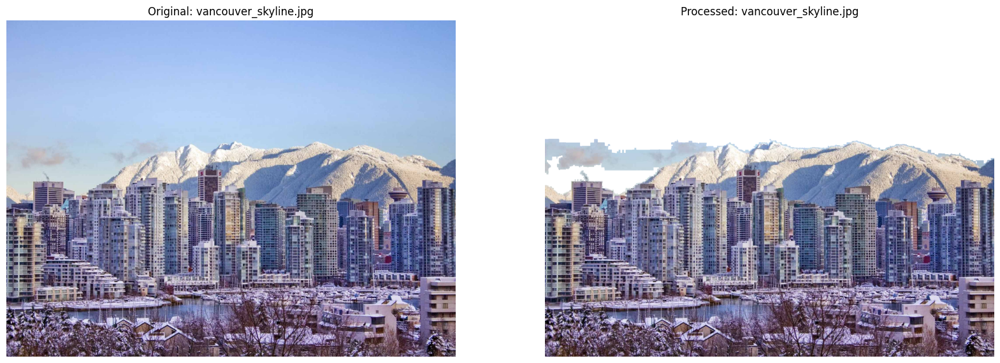

Processed sea-to-sky-highway-1-5145063-1627397506601.jpg and saved to output/sea-to-sky-highway-1-5145063-1627397506601.jpg


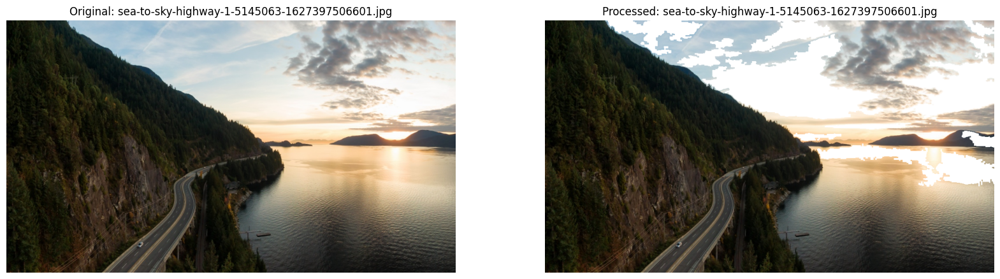

Processed pngtree-city-of-vancouver-british-columbia-vancouver-sky-landscape-photo-image_565291.jpg and saved to output/pngtree-city-of-vancouver-british-columbia-vancouver-sky-landscape-photo-image_565291.jpg


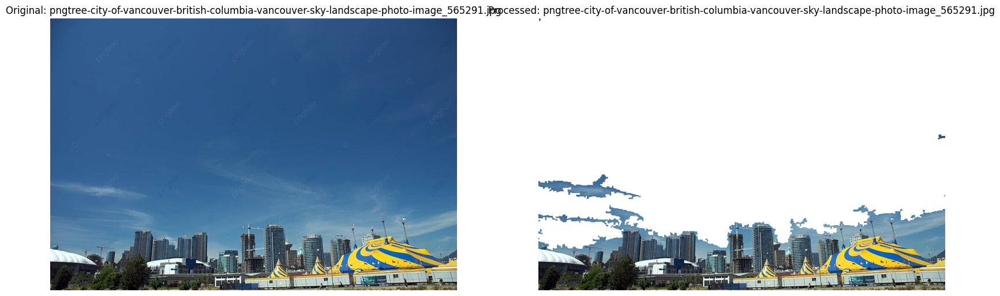

Processed sea-to-sky-highway-weekend_6592fa9f-2899-4c77-affe-8e8f5879970d.jpg and saved to output/sea-to-sky-highway-weekend_6592fa9f-2899-4c77-affe-8e8f5879970d.jpg


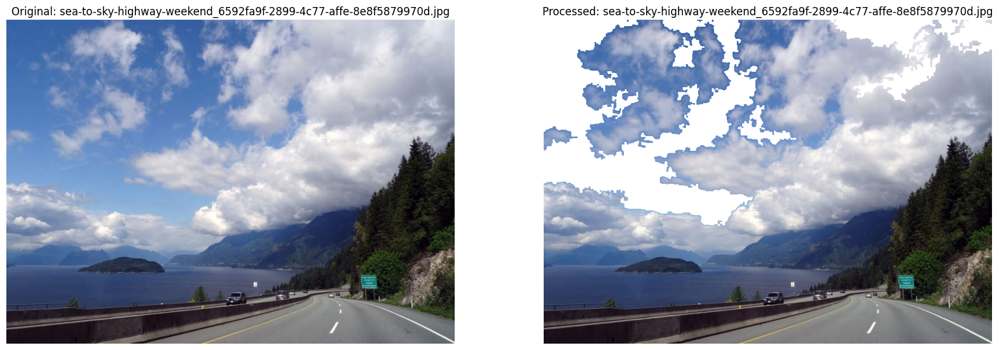

Processed cc.jpg and saved to output/cc.jpg


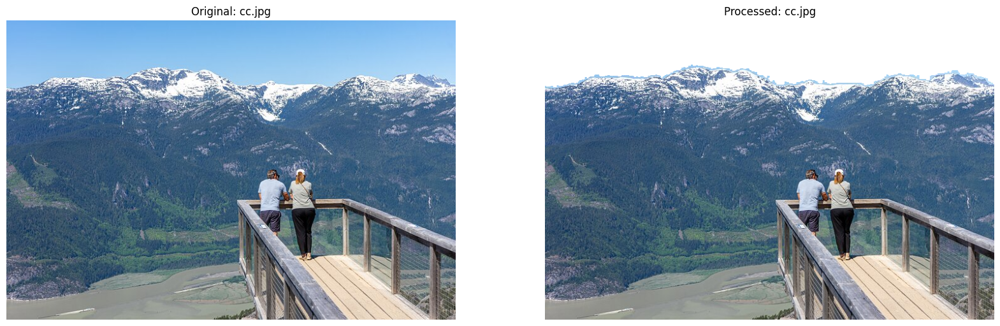

Processed 4240732.jpg and saved to output/4240732.jpg


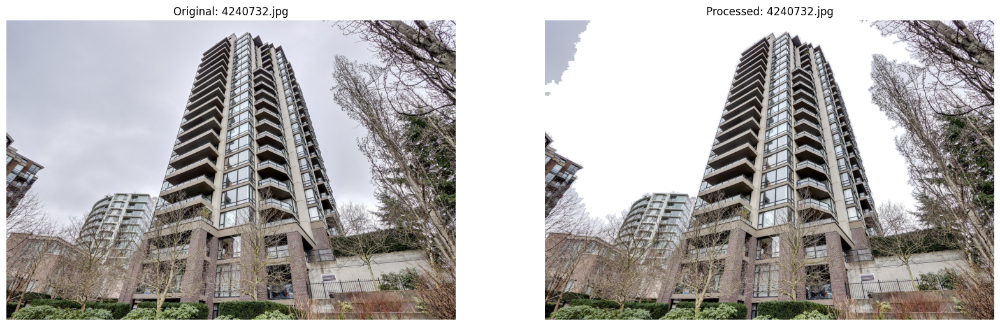

In [8]:
import cv2
import numpy as np
import os

def detect_sky(image_path):
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print("Image not found or unable to read")
        return None

    # Convert to HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Threshold for blue sky and sunset colors
    lower_blue = np.array([10, 50, 50])  # Adjusted for yellow/orange
    upper_blue = np.array([170, 255, 255])  # Adjusted for deep blue
    lower_orange = np.array([0, 50, 50])   # For sunset
    upper_orange = np.array([30, 255, 255])
    lower_white = np.array([0, 0, 210])    # For whitish sky
    upper_white = np.array([180, 30, 255])

    blue_sky_mask = cv2.inRange(hsv_image, lower_blue, upper_blue)
    sunset_mask = cv2.inRange(hsv_image, lower_orange, upper_orange)
    whitish_sky_mask = cv2.inRange(hsv_image, lower_white, upper_white)

    # Combine masks
    mask = cv2.bitwise_or(blue_sky_mask, sunset_mask)
    mask = cv2.bitwise_or(mask, whitish_sky_mask)

    # Remove green areas like mountains
    lower_green = np.array([30, 40, 40])
    upper_green = np.array([80, 255, 255])
    green_mask = cv2.inRange(hsv_image, lower_green, upper_green)
    mask = cv2.bitwise_and(mask, cv2.bitwise_not(green_mask))

    # Calculate gradient magnitude
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    grad_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = cv2.magnitude(grad_x, grad_y)

    # # Save the edge detection result
    # edge_output_path = os.path.join(output_folder, "edges_" + os.path.basename(image_path))
    # cv2.imwrite(edge_output_path, gradient_magnitude)
    # print(f"Edge detection result saved to {edge_output_path}")

    # Gradient threshold
    grad_threshold = 10
    _, gradient_mask = cv2.threshold(gradient_magnitude, grad_threshold, 255, cv2.THRESH_BINARY_INV)

    # Combine color and gradient masks
    combined_mask = cv2.bitwise_and(mask, mask, mask=gradient_mask.astype(np.uint8))

    # Morphological operations to clean up the mask
    kernel = np.ones((3, 3), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel)

    # Find continuous regions (contours)
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    sky_mask = np.zeros_like(combined_mask)

    # Filter the regions based on size and position
    for contour in contours:
        if cv2.contourArea(contour) > 1000:  # Size threshold
            x, y, w, h = cv2.boundingRect(contour)
            if y < image.shape[0] / 2:  # Position threshold (upper half of the image)
                cv2.drawContours(sky_mask, [contour], -1, 255, thickness=cv2.FILLED)

    # Apply the mask to the original image
    sky = cv2.bitwise_and(image, image, mask=sky_mask)

    # Optional: Create a red color layer for sky region
    red_layer = np.zeros_like(image)
    red_layer[:, :] = [255, 255, 255]  # BGR for red
    sky_red = cv2.bitwise_and(red_layer, red_layer, mask=sky_mask)
    result = cv2.addWeighted(image, 1, sky_red, 1, 0)

    return result

input_folder = 'images'
output_folder = 'output'

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

image_display_size = (20, 12)

for filename in os.listdir(input_folder):
    if filename.endswith('.jpg'):
        input_path = os.path.join(input_folder, filename)
        output_path = os.path.join(output_folder, filename)

        processed_image = detect_sky(input_path)

        if processed_image is not None:
            cv2.imwrite(output_path, processed_image)
            print(f"Processed {filename} and saved to {output_path}")

            original_image = cv2.imread(input_path)
            original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

            processed_image = cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB)

            plt.figure(figsize=image_display_size)

            plt.subplot(1, 2, 1)
            plt.imshow(original_image)
            plt.title(f"Original: {filename}")
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(processed_image)
            plt.title(f"Processed: {filename}")
            plt.axis('off')

            plt.show()

        else:
            print(f"Failed to process {filename}")
